In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import missingno as msno
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import os


In [2]:
# Configurar estilo de visualizaciones
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (6, 4)
%matplotlib inline

In [15]:
pd.set_option('display.max_rows', 100) 
pd.set_option('display.max_columns', None) 

# pd.set_option('display.max_columns', None)  # Show all columns
# pd.set_option('display.max_rows', None)     # Show all rows
# pd.set_option('display.max_colwidth', None) # Show entire content of each column
pd.set_option('display.width', None)        # No limit on display width
pd.set_option('display.expand_frame_repr', False)  # Prevent wrapping

In [3]:
# Setting paths
current_dir = os.getcwd()  # Use os.getcwd() to get the current working directory
parent_dir = os.path.dirname(current_dir)
data_dir = os.path.join(parent_dir, "data")
file_path = os.path.join(data_dir, "")

raw_data_csv_path = os.path.join(data_dir, "raw_data.csv")
#----------------------------------------------------------------------------------------------------
# Creating dataframes
df_raw_data_sugar= pd.read_csv(raw_data_csv_path)

df_raw_data_sugar.head()


,Country,Year,Country_Code,Continent,Region,Population,GDP_Per_Capita,Per_Capita_Sugar_Consumption,Total_Sugar_Consumption,Sugar_From_Sugarcane,...,Obesity_Rate,Sugar_Imports,Sugar_Exports,Avg_Retail_Price_Per_Kg,Gov_Tax,Gov_Subsidies,Education_Campaign,Urbanization_Rate,Climate_Conditions,Sugarcane_Production_Yield
0,France,1972,FRA,Europe,Western Europe,2.617306e+08,8692.631696,12.827741,3.357413e+06,68.422963,...,34.094017,5.401670e+06,2.358929e+06,3.864020,0.0,0,0.0,34.503398,3,52.433972
1,Australia,2003,AUS,Oceania,Australia & New Zealand,1.737965e+08,6859.195960,21.362632,3.712750e+06,55.432564,...,16.040118,3.418790e+06,9.694348e+06,3.282101,0.0,0,0.0,31.783067,4,58.382055
2,Germany,1963,DEU,Europe,Western Europe,1.236366e+08,22075.950575,32.077485,3.965951e+06,86.466120,...,14.405741,8.987281e+06,5.451632e+06,1.097687,0.0,0,0.0,51.551345,1,32.184735
3,France,1965,FRA,Europe,Western Europe,2.989961e+08,3728.027392,47.648930,1.424685e+07,69.806707,...,38.499271,5.179004e+06,8.048500e+06,2.761297,0.0,0,0.0,80.386281,2,84.296019
4,Germany,2010,DEU,Europe,Western Europe,7.341531e+06,40420.973962,23.214343,1.704288e+05,63.772278,...,36.190977,6.463439e+06,7.062910e+06,4.219431,0.0,0,1.0,49.701153,3,66.110815


In [14]:
#cargar el dataset
df = pd.read_csv("../data/raw_data.csv")
df.head()

,Country,Year,Country_Code,Continent,Region,Population,GDP_Per_Capita,Per_Capita_Sugar_Consumption,Total_Sugar_Consumption,Sugar_From_Sugarcane,...,Obesity_Rate,Sugar_Imports,Sugar_Exports,Avg_Retail_Price_Per_Kg,Gov_Tax,Gov_Subsidies,Education_Campaign,Urbanization_Rate,Climate_Conditions,Sugarcane_Production_Yield
0,France,1972,FRA,Europe,Western Europe,2.617306e+08,8692.631696,12.827741,3.357413e+06,68.422963,...,34.094017,5.401670e+06,2.358929e+06,3.864020,0.0,0,0.0,34.503398,3,52.433972
1,Australia,2003,AUS,Oceania,Australia & New Zealand,1.737965e+08,6859.195960,21.362632,3.712750e+06,55.432564,...,16.040118,3.418790e+06,9.694348e+06,3.282101,0.0,0,0.0,31.783067,4,58.382055
2,Germany,1963,DEU,Europe,Western Europe,1.236366e+08,22075.950575,32.077485,3.965951e+06,86.466120,...,14.405741,8.987281e+06,5.451632e+06,1.097687,0.0,0,0.0,51.551345,1,32.184735
3,France,1965,FRA,Europe,Western Europe,2.989961e+08,3728.027392,47.648930,1.424685e+07,69.806707,...,38.499271,5.179004e+06,8.048500e+06,2.761297,0.0,0,0.0,80.386281,2,84.296019
4,Germany,2010,DEU,Europe,Western Europe,7.341531e+06,40420.973962,23.214343,1.704288e+05,63.772278,...,36.190977,6.463439e+06,7.062910e+06,4.219431,0.0,0,1.0,49.701153,3,66.110815


In [16]:
#buscando valores nulos
df.isnull().sum()

Country                           0
Year                              0
Country_Code                      0
Continent                         0
Region                            0
Population                        0
GDP_Per_Capita                    0
Per_Capita_Sugar_Consumption      0
Total_Sugar_Consumption           0
Sugar_From_Sugarcane              0
Sugar_From_Beet                   0
Sugar_From_HFCS                   0
Sugar_From_Other                  0
Processed_Food_Consumption        0
Avg_Daily_Sugar_Intake            0
Diabetes_Prevalence               0
Obesity_Rate                      0
Sugar_Imports                     0
Sugar_Exports                     0
Avg_Retail_Price_Per_Kg           0
Gov_Tax                         531
Gov_Subsidies                     0
Education_Campaign              520
Urbanization_Rate                 0
Climate_Conditions                0
Sugarcane_Production_Yield        0
dtype: int64

In [17]:
df.columns.to_list()

['Country',
 'Year',
 'Country_Code',
 'Continent',
 'Region',
 'Population',
 'GDP_Per_Capita',
 'Per_Capita_Sugar_Consumption',
 'Total_Sugar_Consumption',
 'Sugar_From_Sugarcane',
 'Sugar_From_Beet',
 'Sugar_From_HFCS',
 'Sugar_From_Other',
 'Processed_Food_Consumption',
 'Avg_Daily_Sugar_Intake',
 'Diabetes_Prevalence',
 'Obesity_Rate',
 'Sugar_Imports',
 'Sugar_Exports',
 'Avg_Retail_Price_Per_Kg',
 'Gov_Tax',
 'Gov_Subsidies',
 'Education_Campaign',
 'Urbanization_Rate',
 'Climate_Conditions',
 'Sugarcane_Production_Yield']

In [19]:
def check_missing_data(df):
    nulls = df.isnull().sum()
    null_percentage = (nulls / len(df) * 100).round(2)
    null_report = pd.DataFrame({'null content': nulls, 'null%':null_percentage})
    print(f"Qty of rows: ({len(df)})")
    print(null_report)

check_df = check_missing_data(df)
# Visualizar los datos faltantes  


Qty of rows: (10000)
                              null content  null%
Country                                  0   0.00
Year                                     0   0.00
Country_Code                             0   0.00
Continent                                0   0.00
Region                                   0   0.00
Population                               0   0.00
GDP_Per_Capita                           0   0.00
Per_Capita_Sugar_Consumption             0   0.00
Total_Sugar_Consumption                  0   0.00
Sugar_From_Sugarcane                     0   0.00
Sugar_From_Beet                          0   0.00
Sugar_From_HFCS                          0   0.00
Sugar_From_Other                         0   0.00
Processed_Food_Consumption               0   0.00
Avg_Daily_Sugar_Intake                   0   0.00
Diabetes_Prevalence                      0   0.00
Obesity_Rate                             0   0.00
Sugar_Imports                            0   0.00
Sugar_Exports                

In [24]:
def check_duplicates(df, subset=None):
    dups = df[df.duplicated(subset=subset, keep=False)]
    pd.set_option('display.max_rows', 5) 
    print(f"Duplicates ({len(dups)}):\n{dups}" if not dups.empty else "No duplicates found.")

check_duplicates(df) 

No duplicates found.


# como no hay duplicados se continua con el eda

In [25]:
# información de los datos
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 26 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Country                       10000 non-null  object 
 1   Year                          10000 non-null  int64  
 2   Country_Code                  10000 non-null  object 
 3   Continent                     10000 non-null  object 
 4   Region                        10000 non-null  object 
 5   Population                    10000 non-null  float64
 6   GDP_Per_Capita                10000 non-null  float64
 7   Per_Capita_Sugar_Consumption  10000 non-null  float64
 8   Total_Sugar_Consumption       10000 non-null  float64
 9   Sugar_From_Sugarcane          10000 non-null  float64
 10  Sugar_From_Beet               10000 non-null  float64
 11  Sugar_From_HFCS               10000 non-null  float64
 12  Sugar_From_Other              10000 non-null  float64
 13  Pr

In [26]:
# estadisticas descriptivas
df.describe()

,Year,Population,GDP_Per_Capita,Per_Capita_Sugar_Consumption,Total_Sugar_Consumption,Sugar_From_Sugarcane,Sugar_From_Beet,Sugar_From_HFCS,Sugar_From_Other,Processed_Food_Consumption,Avg_Daily_Sugar_Intake,Diabetes_Prevalence,Obesity_Rate,Sugar_Imports,Sugar_Exports,Avg_Retail_Price_Per_Kg,Gov_Tax,Gov_Subsidies,Education_Campaign,Urbanization_Rate,Climate_Conditions,Sugarcane_Production_Yield
count,10000.0000,1.000000e+04,10000.000000,10000.000000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,1.000000e+04,1.000000e+04,10000.000000,9469.000000,10000.0000,9480.000000,10000.000000,10000.0000,10000.000000
mean,1991.3303,1.501189e+08,25242.491756,37.626027,5.650157e+06,70.028543,22.494559,29.811113,-22.334215,155.294166,103.095314,9.349124,22.355718,5.040963e+06,5.077761e+06,2.747125,0.150914,0.2975,0.406962,49.973144,2.9771,65.251931
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75%,2007.0000,2.250870e+08,37558.130715,54.003484,8.484738e+06,80.007973,31.448762,44.571011,-5.925863,228.076059,147.969545,12.657526,31.006182,7.552546e+06,7.606691e+06,3.872086,0.000000,1.0000,1.000000,70.072238,4.0000,82.512623
max,2023.0000,2.999917e+08,49997.014954,69.991881,2.090366e+07,89.994688,39.999721,59.998558,40.710226,299.934874,191.777755,16.547123,39.997246,9.999894e+06,9.999107e+06,4.999483,1.000000,1.0000,1.000000,89.998222,5.0000,99.993296


In [27]:
# verificar que dimesniones tiene el dataset
print(f"el dataset tiene {df.shape[0]} filas y {df.shape[1]} columnas")

el dataset tiene 10000 filas y 26 columnas


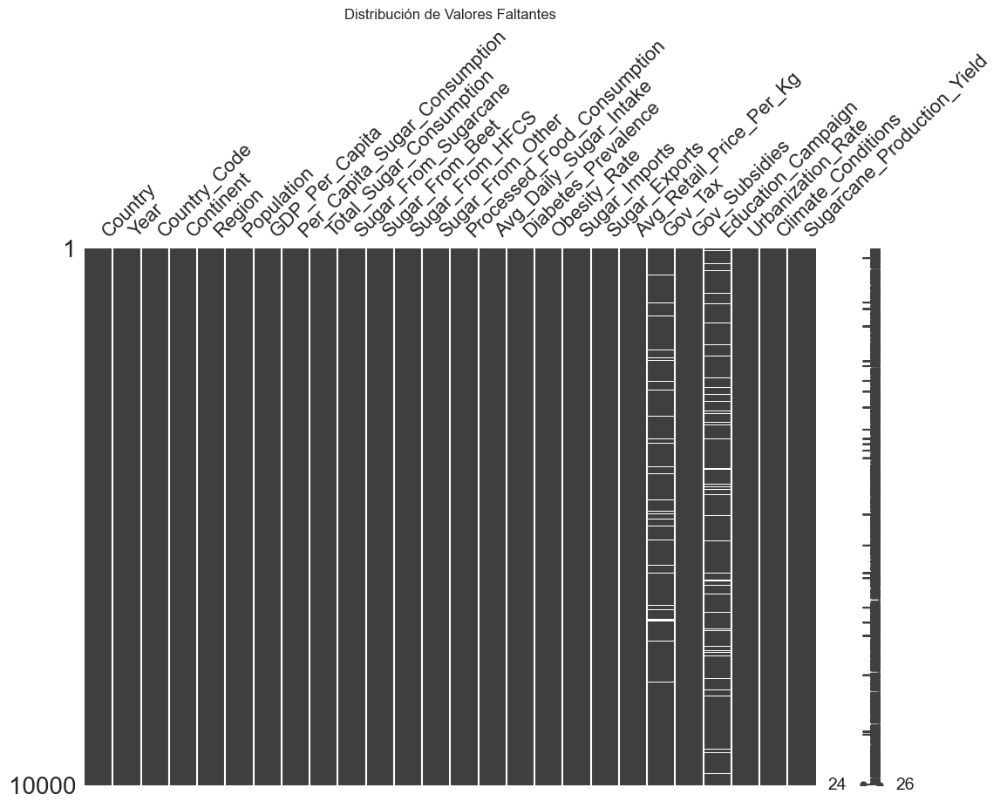

In [28]:
# Visualización de valores faltantes
msno.matrix(df, figsize=(12, 8))
plt.title('Distribución de Valores Faltantes')
plt.show()


In [30]:
# Porcentaje de valores faltantes
pd.set_option('display.max_rows', None)  # Mostrar todas las filas

missing_percent = df.isnull().sum() / len(df) * 100
print(missing_percent)

Country                         0.00
Year                            0.00
Country_Code                    0.00
Continent                       0.00
Region                          0.00
Population                      0.00
GDP_Per_Capita                  0.00
Per_Capita_Sugar_Consumption    0.00
Total_Sugar_Consumption         0.00
Sugar_From_Sugarcane            0.00
Sugar_From_Beet                 0.00
Sugar_From_HFCS                 0.00
Sugar_From_Other                0.00
Processed_Food_Consumption      0.00
Avg_Daily_Sugar_Intake          0.00
Diabetes_Prevalence             0.00
Obesity_Rate                    0.00
Sugar_Imports                   0.00
Sugar_Exports                   0.00
Avg_Retail_Price_Per_Kg         0.00
Gov_Tax                         5.31
Gov_Subsidies                   0.00
Education_Campaign              5.20
Urbanization_Rate               0.00
Climate_Conditions              0.00
Sugarcane_Production_Yield      0.00
dtype: float64


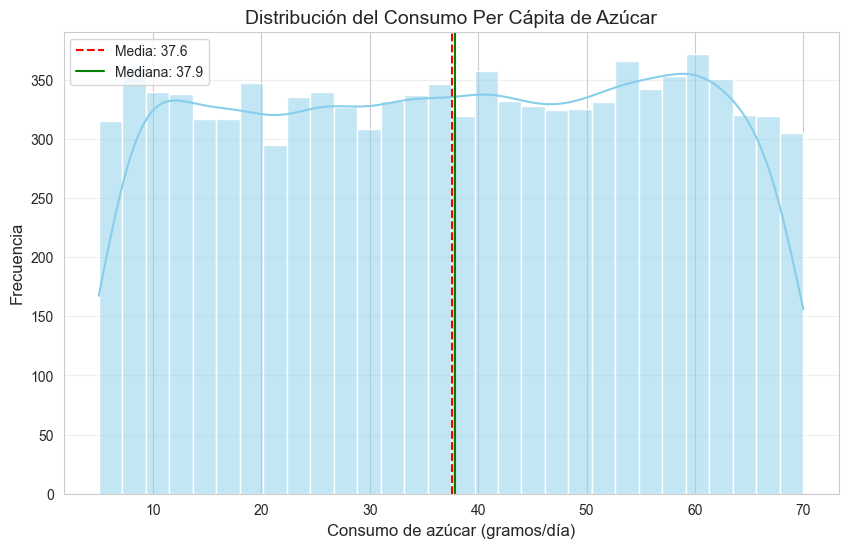

In [33]:


plt.figure(figsize=(10, 6))
sns.histplot(df["Per_Capita_Sugar_Consumption"], kde=True, bins=30, color='skyblue')
plt.title("Distribución del Consumo Per Cápita de Azúcar", fontsize=14)
plt.xlabel("Consumo de azúcar (gramos/día)", fontsize=12)
plt.ylabel("Frecuencia", fontsize=12)

# Añadir media y mediana
mean = df["Per_Capita_Sugar_Consumption"].mean()
median = df["Per_Capita_Sugar_Consumption"].median()
plt.axvline(mean, color='red', linestyle='--', label=f'Media: {mean:.1f}')
plt.axvline(median, color='green', linestyle='-', label=f'Mediana: {median:.1f}')

plt.legend()
plt.grid(axis='y', alpha=0.3)
plt.show()

C:\Users\Administrator\AppData\Local\Temp\ipykernel_9472\1455179544.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='Continent', data=df, palette='viridis')


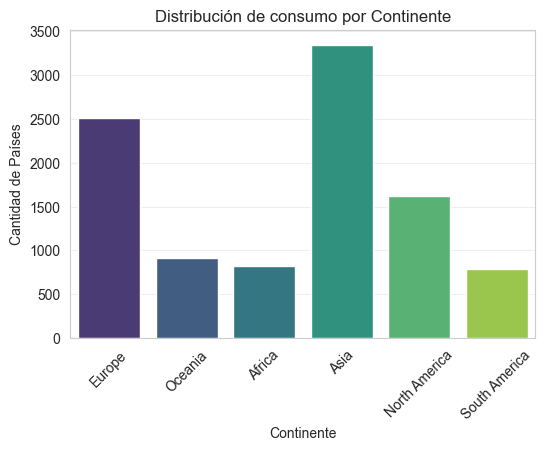

In [41]:
# distribucion de continentes
sns.countplot(x='Continent', data=df, palette='viridis')
plt.title("Distribución de consumo por Continente")
plt.xlabel("Continente")
plt.ylabel("Cantidad de Países")
plt.xticks(rotation=45)
plt.grid(axis='y', alpha=0.3)
plt.show()

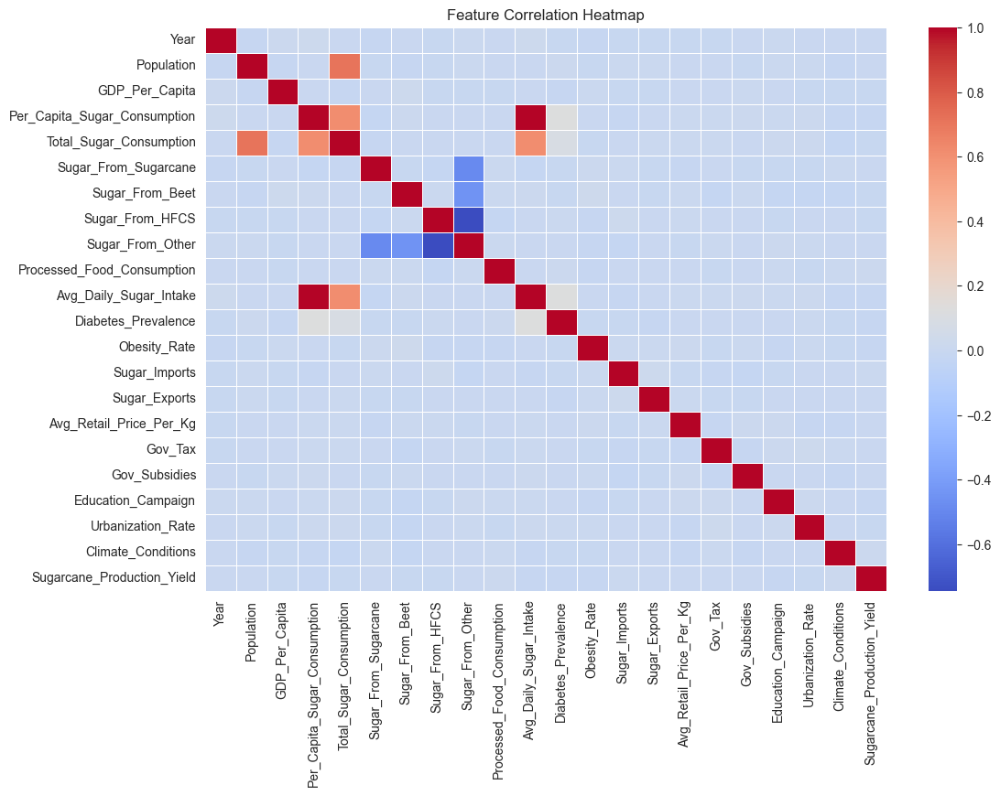

In [50]:
# Correlation heatmap to understand feature relationships
# Select only numerical columns for correlation
numeric_df = df.select_dtypes(include=[np.number])

# Correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), cmap="coolwarm", annot=False, linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

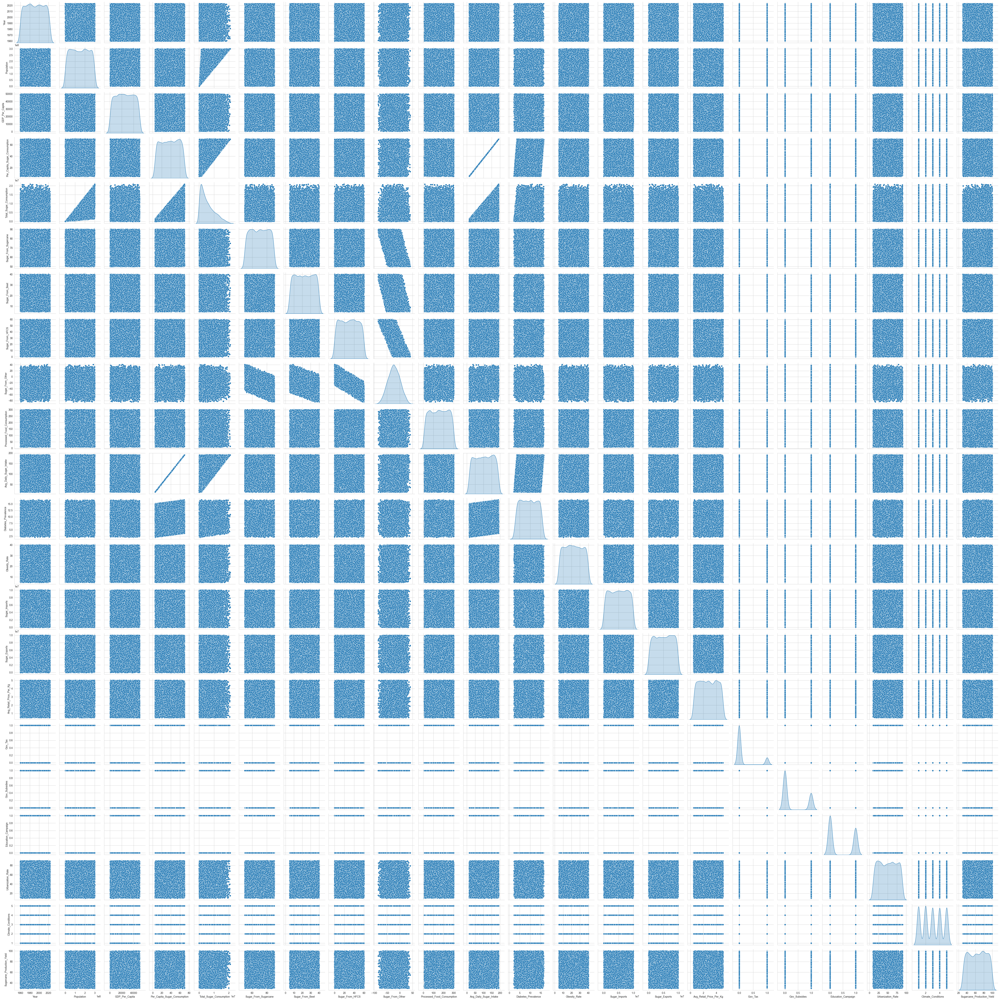

<Figure size 1000x800 with 0 Axes>

In [51]:
# Relación entre variables numéricas

sns.pairplot(df, diag_kind='kde')
plt.figure(figsize=(10, 8))
plt.suptitle('Relación entre Variables Numéricas', y=1.02)
plt.show()

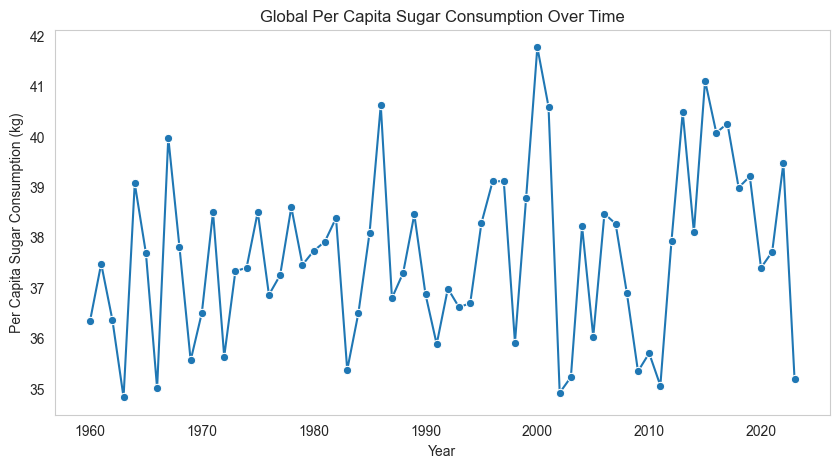

In [52]:
# Visualize sugar consumption trends over the years
plt.figure(figsize=(10, 5))
sns.lineplot(data=df.groupby("Year")["Per_Capita_Sugar_Consumption"].mean().reset_index(), 
             x="Year", y="Per_Capita_Sugar_Consumption", marker="o")
plt.title("Global Per Capita Sugar Consumption Over Time")
plt.xlabel("Year")
plt.ylabel("Per Capita Sugar Consumption (kg)")
plt.grid()
plt.show()

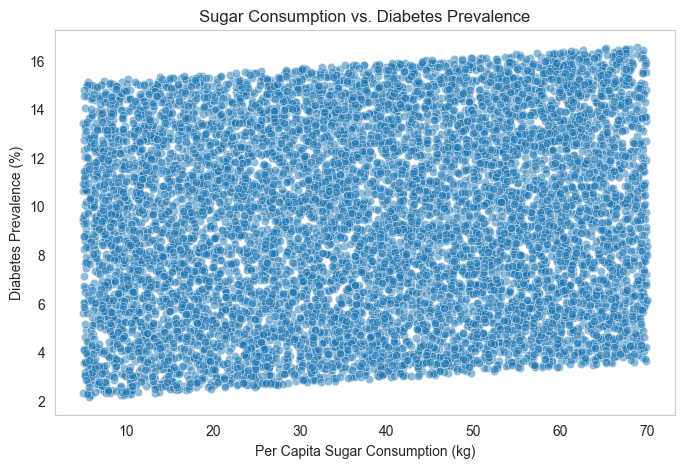


Analysis complete. Cleaned dataset saved as 'cleaned_sugar_consumption_dataset.csv'.


In [53]:
# Relationship between sugar consumption and diabetes prevalence
plt.figure(figsize=(8, 5))
sns.scatterplot(data=df, x="Per_Capita_Sugar_Consumption", y="Diabetes_Prevalence", alpha=0.5)
plt.title("Sugar Consumption vs. Diabetes Prevalence")
plt.xlabel("Per Capita Sugar Consumption (kg)")
plt.ylabel("Diabetes Prevalence (%)")
plt.grid()
plt.show()

# Save cleaned dataset
df.to_csv("cleaned_sugar_consumption_dataset.csv", index=False)

print("\nAnalysis complete. Cleaned dataset saved as 'cleaned_sugar_consumption_dataset.csv'.")